In [1]:
from financial_market import *

### 1.1 Get S&P 500 index from January 2000 to June 2022 for stocks that were present the whole time and create a table of their closing prices.

In [2]:
df_concat, df_sector_dict, symbols = load_dataframe()
df_concat

,symbol,security,sec_filings,gics_sector,gics_sub-industry,headquarters_location,date_first_added,cik,founded
253,IPG,The Interpublic Group of Companies,reports,Communication Services,Advertising,"New York City, New York",1992-10-01,51644,1961 (1930)
51,T,AT&T,reports,Communication Services,Integrated Telecommunication Services,"Dallas, Texas",1983-11-30,732717,1983 (1885)
470,VZ,Verizon,reports,Communication Services,Integrated Telecommunication Services,"New York City, New York",1983-11-30,732712,1983 (1877)
353,OMC,Omnicom Group,reports,Communication Services,Advertising,"New York City, New York",NaN,29989,1986
361,PARA,Paramount Global,reports,Communication Services,Movies & Entertainment,"New York City, New York",NaN,813828,2019 (1952)
...,...,...,...,...,...,...,...,...,...
117,CMS,CMS Energy,reports,Utilities,Multi-Utilities,"Jackson, Michigan",1999-05-03,811156,1886
11,AES,AES Corporation,reports,Utilities,Independent Power Producers & Energy Traders,"Arlington, Virginia",1998-10-02,874761,1981
98,CNP,CenterPoint Energy,reports,Utilities,Multi-Utilities,"Houston, Texas",1985-07-31,1130310,1882
378,PPL,PPL Corporation,reports,Utilities,Electric Utilities,"Allentown, Pennsylvania",NaN,922224,1920


In [3]:
df, df_sector, df_both, not_done_for = get_closing_prices(symbols, df_sector_dict)

TPR not in past
- BF.B: No data found for this date range, symbol may be delisted
BF.B delisted
MET not in past
HWM not in past
WRK not in past
PARA not in past


In [4]:
# these have become nan because symbols has values that aren't collected
print(df.isnull().values.any(), not_done_for)

False ['BF.B']


In [5]:
print(df.columns[df.isna().any()].tolist())

[]


In [6]:
df.to_excel("output/excel/sp500_stock_names.xlsx")
df_sector.to_excel("output/excel/sp500_sector_names.xlsx")
df_both.to_excel("output/excel/sp500_both.xlsx")

In [7]:
df.to_csv("output/csv/sp500_stock_names.csv")
df_sector.to_csv("output/csv/sp500_sector_names.csv")
df_both.to_csv("output/csv/sp500_both.csv")

[*********************100%***********************]  1 of 1 completed


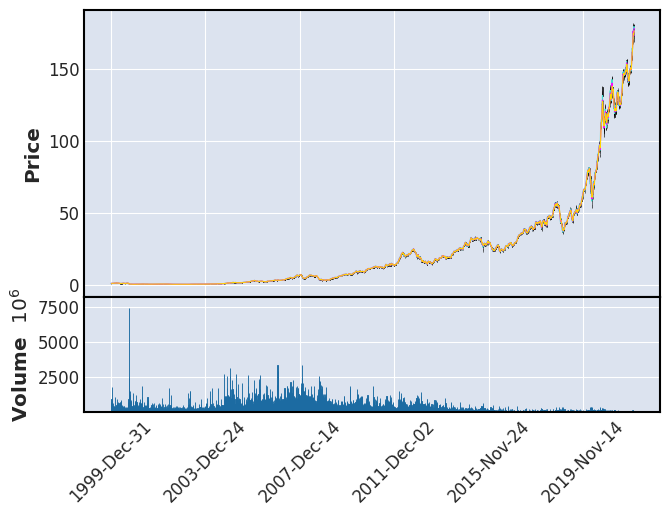

In [8]:
# here you can change the stock to be plotted to any other
# ticker value that you want to be plotted
stock_to_be_plotted = "AAPL"
plot_candlesticks(stock_to_be_plotted)

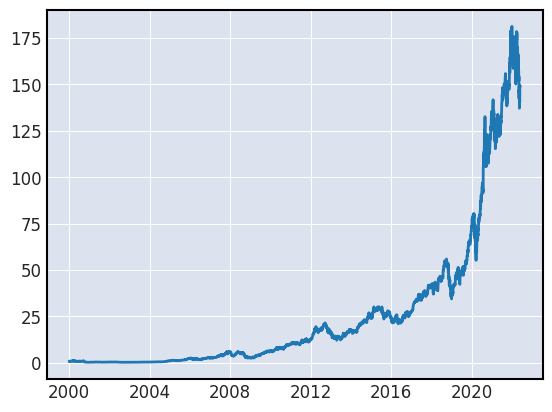

In [9]:
plt.plot(df["date"], df["AAPL"])

### 1.2 Plot all the closing price time series in nx3 subplots.

Here you can clearly see the stock name as well as the sector the stock belongs to (format: `stock_sector`)

In [4]:
df_both = pd.read_csv("output/csv/sp500_both.csv", index_col=None)
df_both = df_both.iloc[:, 1:]
df_both["date"] = df_both['date'].apply(pd.to_datetime)

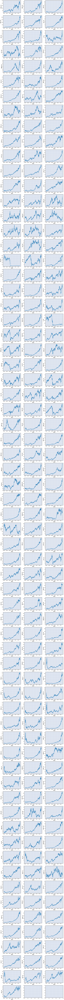

In [11]:
plot_all_charts(df_both)

In [7]:
def plot_all_charts_2(df):
    ticker_count = 1
    col_list = df.columns[1:]
    # for a in range(0, len(df.columns[1:])//9 + 1):
    for a in range(0, 30):
        fig = plt.figure(figsize=(10, 8))
        outer = gridspec.GridSpec(3, 3, wspace=0.3, hspace=0.1)
        for i in range(9):
            inner = gridspec.GridSpecFromSubplotSpec(1, 1,
                            subplot_spec=outer[i], wspace=0.1, hspace=0.1)
            for j in range(1):
                ax = plt.Subplot(fig, inner[j])
                ax.plot(df.iloc[:, 0], df.iloc[:, ticker_count])
                ticker_count += 1
                t = ax.text(0, 0, col_list[ticker_count])
                t.set_ha('right')
                if i in (8, 7, 6):
                    ax.set_xticks(["2000", "2012", "2022"])
                    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
                    # Rotates and right-aligns the x labels so they don't crowd each other.
                    for label in ax.get_xticklabels(which='major'):
                        label.set(rotation=30, horizontalalignment='right')
                else:
                    ax.set_xticks([])
                fig.add_subplot(ax)
        fig.show()

IndexError: index 199 is out of bounds for axis 0 with size 199

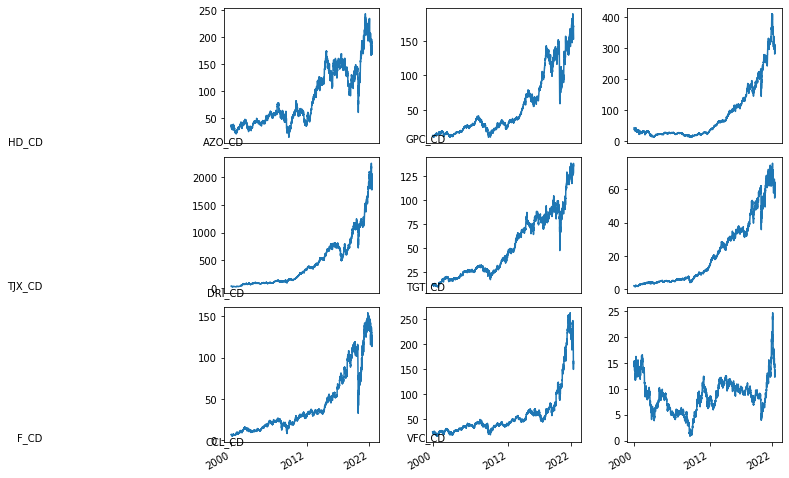

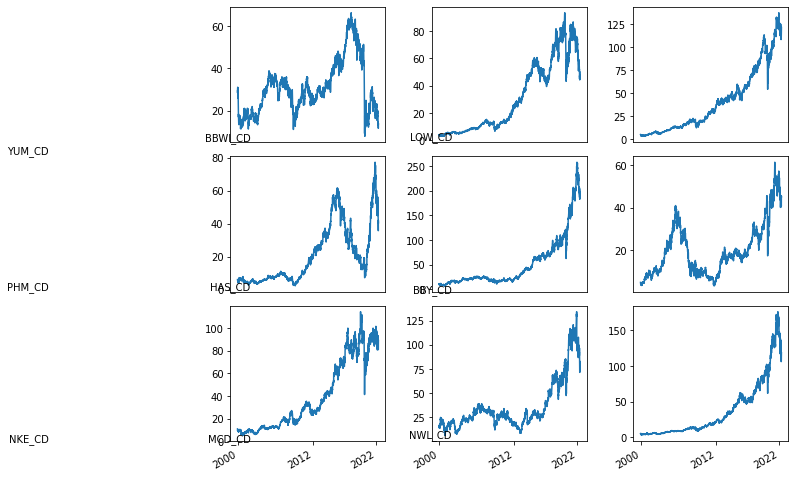

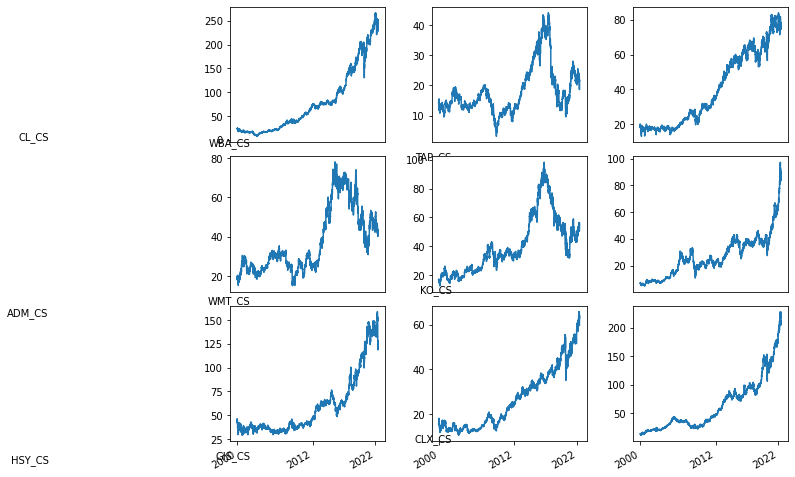

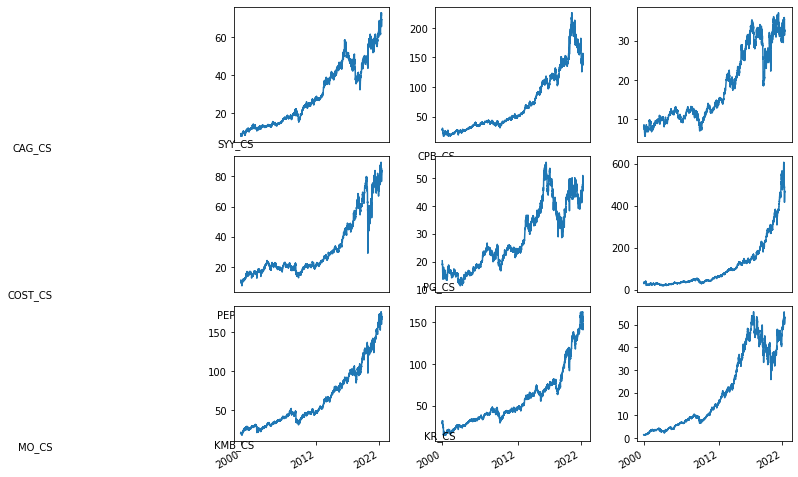

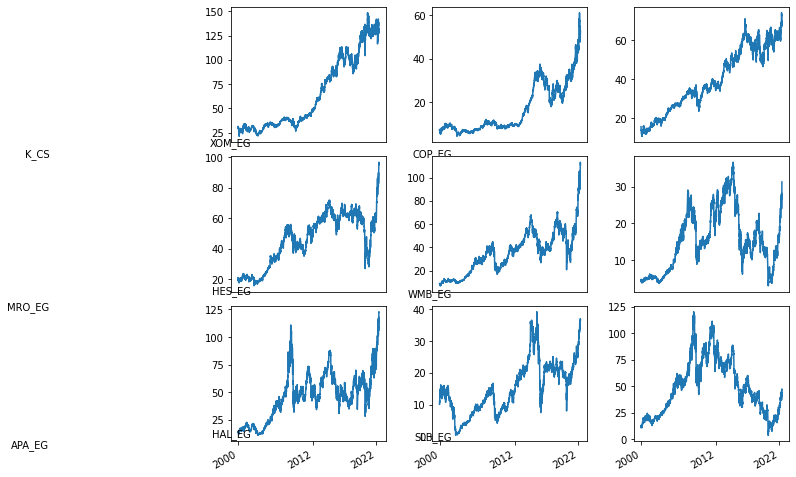

...

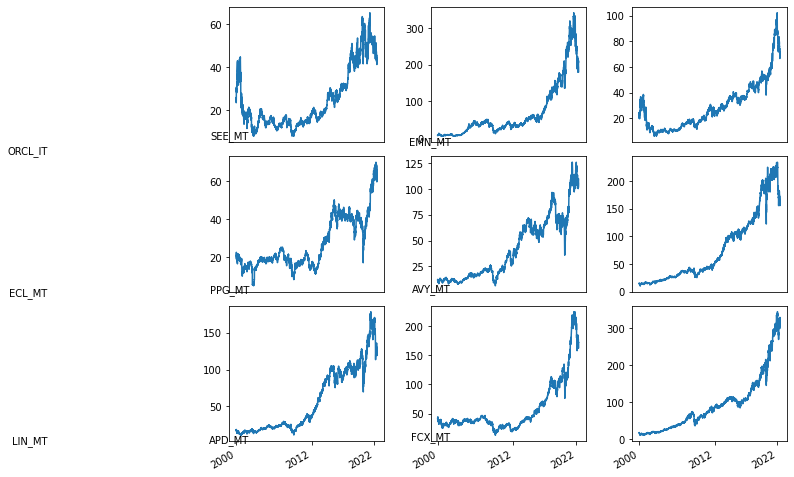

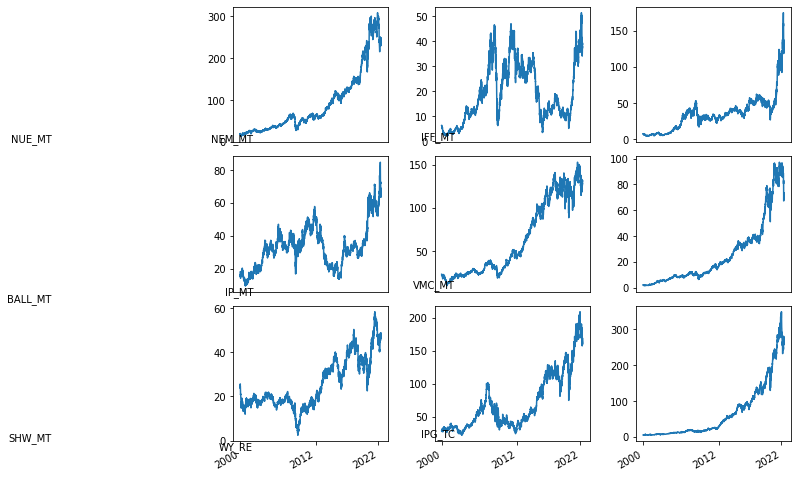

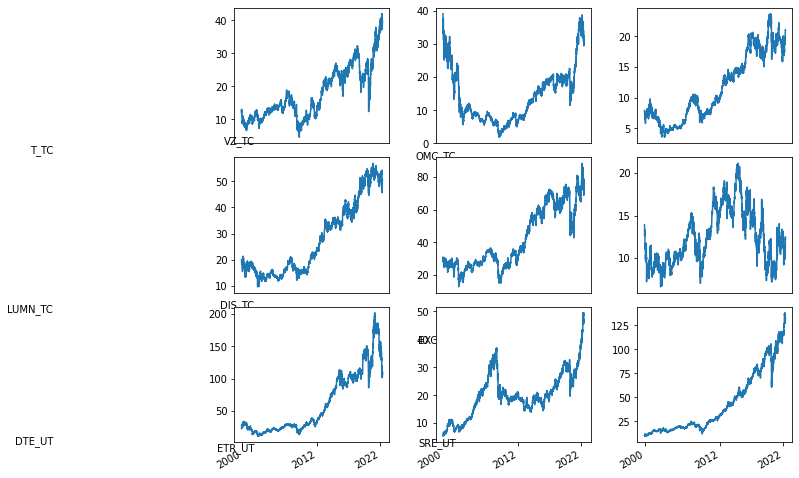

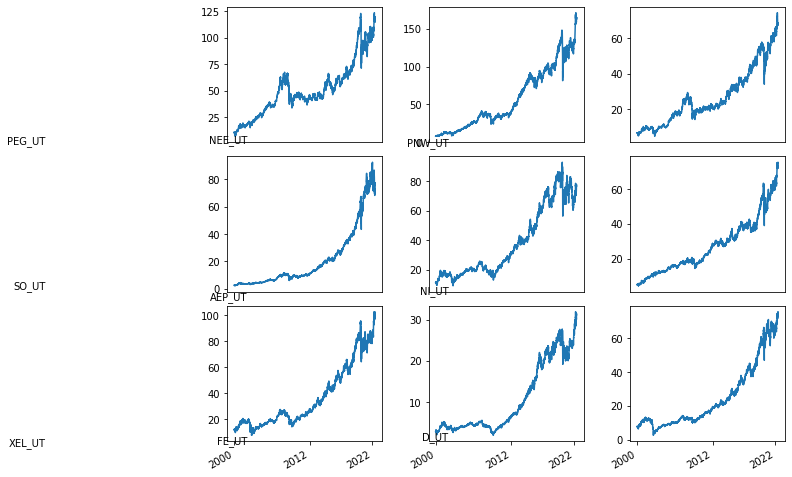

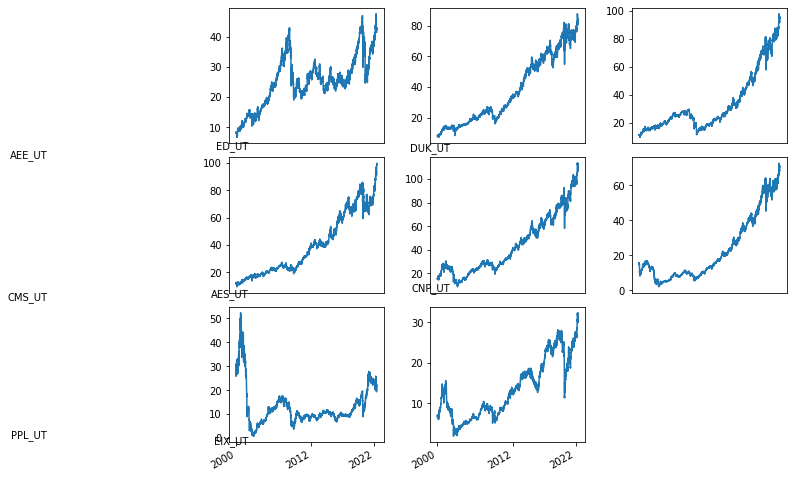

In [8]:
plot_all_charts_2(df_both)

### 1.3 Construct a correlation matrix for full-time using log returns r(t) = ln(P(t)) - ln(P(t-1)) and plot it.

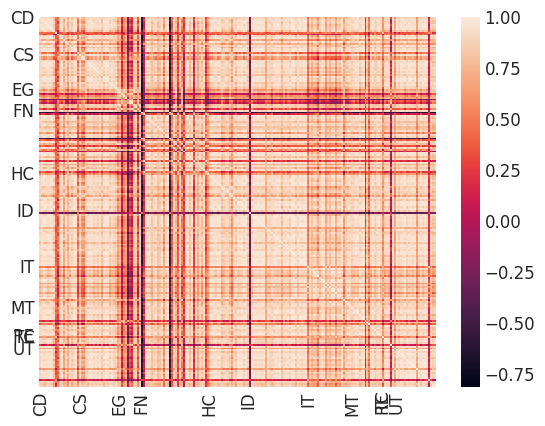

In [12]:
# df = pd.read_excel("output/excel/sp500_sector_names.xlsx", sheet_name="Sheet1", index_col=None)
df = pd.read_csv("output/csv/sp500_sector_names.csv", index_col=None)
df = df.iloc[:, 2:]
# this is without calculating the log returns.
plot_corr_mat(df)

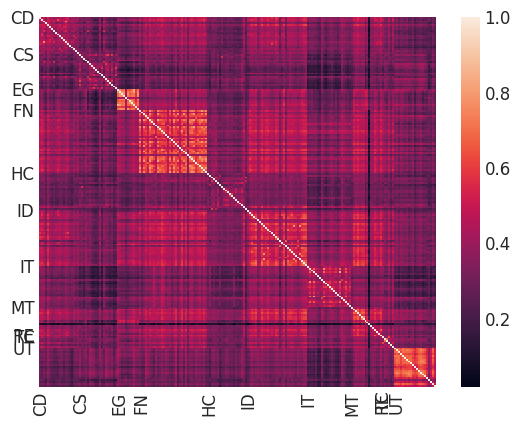

In [13]:
# calculating log returns and then plotting
for i in df.columns:
    df[i] = np.log(df[i]/df[i].shift(1))
df = df.iloc[1:, :]
plot_corr_mat(df)

### 1.4 Construct correlation matrices using r(t) of epoch size 400 working days and with a shift of 200 days.

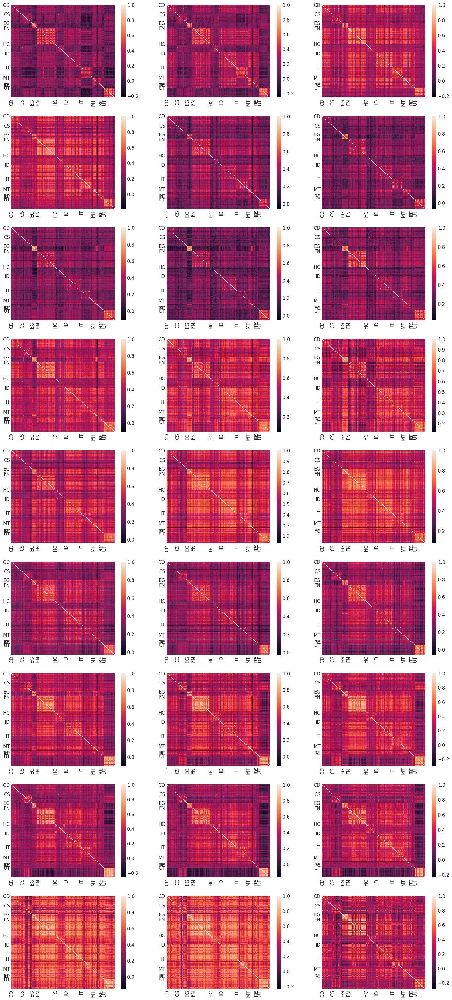

In [14]:
dict_col = ticker_val_locations(df)
fig, axes = plt.subplots(len(df) // (200 * 3), 3, figsize=(20, 5 * (len(df) // (200 * 3))))
count = 0
for i in range(0, len(df) - 200, 200):
    try:
        p = sns.heatmap(df.iloc[i:i+400,:].corr(), ax=axes[count//3, count%3])
        p.set_xticks(ticks=list(dict_col.values()), labels=list(dict_col.keys()))
        p.set_yticks(ticks=list(dict_col.values()), labels=list(dict_col.keys()))
        count += 1
    except:
        pass